In [7]:
import os
import numpy as np
import pandas as pd
from datetime import datetime, timedelta
from gensim import corpora, models
import nltk
from nltk.corpus import stopwords
nltk.download('stopwords')
from sklearn.feature_extraction.text import TfidfVectorizer


[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/nicolasmalz/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [2]:
directory = 'output_texts/'

texts = []


# Loop through the file range
for i in range(1, 500):
    file_path = os.path.join(directory, f'{i}.txt')

    # Check if the file exists to avoid errors
    if os.path.exists(file_path):
        with open(file_path, 'r', encoding='utf-8') as file:
            texts.append(file.read())
    else:
        print(f"File {i}.txt not found.")

File 2.txt not found.
File 3.txt not found.
File 4.txt not found.
File 5.txt not found.
File 205.txt not found.
File 217.txt not found.
File 243.txt not found.
File 313.txt not found.
File 332.txt not found.
File 456.txt not found.
File 485.txt not found.
File 486.txt not found.
File 487.txt not found.
File 488.txt not found.
File 489.txt not found.
File 490.txt not found.
File 491.txt not found.
File 492.txt not found.
File 493.txt not found.
File 494.txt not found.
File 495.txt not found.
File 496.txt not found.
File 497.txt not found.
File 498.txt not found.
File 499.txt not found.


In [3]:
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
import string
import nltk

# Download necessary NLTK data
nltk.download('punkt')
nltk.download('stopwords')

# Initialize a Porter Stemmer for stemming
stemmer = PorterStemmer()

# Initialize stopwords (commonly used words that are generally ignored)
stop_words = set(stopwords.words('english'))

# Preprocessing function
def preprocess_text(text):
    # Tokenization
    tokens = word_tokenize(text)
    
    # Lowercasing and removing punctuation
    tokens = [word.lower() for word in tokens if word.isalpha()]
    
    # Removing stopwords
    tokens = [word for word in tokens if word not in stop_words]
    
    # Stemming
    tokens = [stemmer.stem(word) for word in tokens]
    
    return tokens

# Apply preprocessing to each document
preprocessed_texts = [preprocess_text(text) for text in texts]

# Join the tokens back together

texts_for_tfidf = [" ".join(doc) for doc in preprocessed_texts]


[nltk_data] Downloading package punkt to
[nltk_data]     /Users/nicolasmalz/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/nicolasmalz/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [4]:
from transformers import BertTokenizer, BertModel

# Load pre-trained model tokenizer
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')

# Load pre-trained model
model = BertModel.from_pretrained('bert-base-uncased')


/Users/nicolasmalz/miniforge3/envs/base2/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [5]:
import torch

def get_bert_embeddings(model, tokenizer, text):
    # Tokenize the text
    inputs = tokenizer(text, return_tensors='pt', truncation=True, max_length=512)
    
    # Get embeddings
    with torch.no_grad():
        outputs = model(**inputs)
    
    # The embeddings of the text are in the last_hidden_state
    embeddings = outputs.last_hidden_state.mean(dim=1).squeeze()
    return embeddings.numpy()

# Analyzing each document
embeddings = [get_bert_embeddings(model, tokenizer, text) for text in texts_for_tfidf]


In [8]:
from sklearn.cluster import KMeans

# Define the number of clusters
num_clusters = 5  # Adjust as needed

# Perform K-Means clustering
kmeans = KMeans(n_clusters=num_clusters, random_state=42)
clusters = kmeans.fit_predict(np.array(embeddings))

# Analyze the clusters
for i in range(num_clusters):
    print(f"\nCluster {i}:")
    for j, cluster in enumerate(clusters):
        if cluster == i:
            print(texts[j])  # Print the corresponding document


/Users/nicolasmalz/miniforge3/envs/base2/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)



Cluster 0:
Coal falls by 2-4% in 2015; Gates Foundation loses on fossil fuels; setbacks for coal in Japan & India.November 19, 2015View this email in your browsereditor's noteFor years the coal industry’s PR mantra has been that coal power is here to stay for decades more, notwithstanding accelerating climate change. However, as the latest data reveals a two to four per cent fall in coal consumption in 2015 and the UK plans to shut all coal plants by 2025, the question is now becoming ‘how fast will coal fall’? This week a new agreement at the OECD, while not perfect, signals the further demise of coal as more projects are deprived of public financing.Bob BurtonCoalWire EditorfeaturesGlobal coal consumption falls 2-4% in 2015Global coal consumption is on track to fall by between two and four percent in 2015 due to declining consumption in the biggest coal-burning countries such as ChinawritesTim Buckley from the Institute for Energy Economics & Financial Analysis.Tweet:Global #coal co

In [9]:
from sklearn.metrics.pairwise import cosine_similarity

# Compute cosine similarity
similarity_matrix = cosine_similarity(embeddings)

# Example: Find most similar document to the first one
most_similar_index = similarity_matrix[0].argsort()[::-1][1]
print("Document most similar to the first document is:", texts[most_similar_index])


Document most similar to the first document is: CoalWire: BHP Billiton scraps export terminal, Canadian tailings dam collapsesNovember 7, 2013View this email in your browsercampaignsClimate summit host drags feet on coalAhead of the United Nations climate conference in Warsaw, the Polish Prime Minister has been urged by a coalition of environmental groups to withdraw his support for the Opole power plant expansion. In a letter published in an influential Polish newspaper,Rzeczpospolita, the groups raise concerns about the cost of the plant for Polish consumers. The President of state-owned utility PGE has stated that the new plant would only be economically viable if the wholesale electricity price was increased by 50%. Poland, which is heavily reliant on lignite-fired power stations, has been a leading opponent of moves by the European Union to cut greenhouse gas emissions and increase renewable energy capacity.(TckTckTck,New York Times)Suggested Tweet:Groups urge#PolandPM@premiertusk

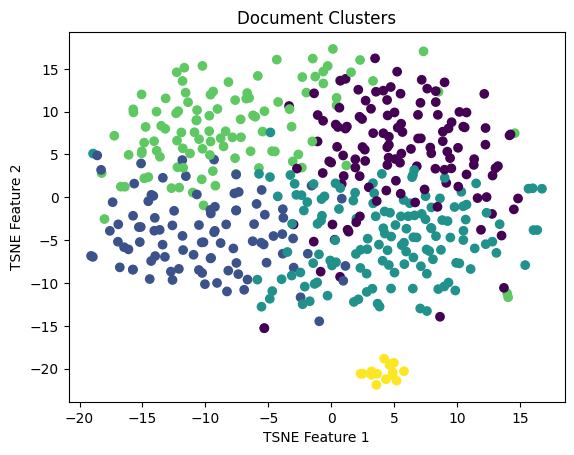

In [11]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt


# Convert the list of embeddings to a 2D numpy array
embeddings_array = np.vstack(embeddings)



# Reduce dimensions (for visualization purposes)
tsne = TSNE(n_components=2, random_state=42)
reduced_embeddings = tsne.fit_transform(embeddings_array)

# Plot
plt.scatter(reduced_embeddings[:, 0], reduced_embeddings[:, 1], c=clusters)
plt.title('Document Clusters')
plt.xlabel('TSNE Feature 1')
plt.ylabel('TSNE Feature 2')
plt.show()



In [13]:
import csv

# Create a dictionary or list to map texts to their clusters
cluster_mapping = {i: [] for i in range(num_clusters)}
for text, cluster_label in zip(texts, clusters):
    cluster_mapping[cluster_label].append(text)


for cluster, texts_in_cluster in cluster_mapping.items():
    print(f"\nCluster {cluster}:")
    for text in texts_in_cluster:
        print(text)


# Create a CSV file to save the mappings
with open('cluster_mappings.csv', 'w', newline='', encoding='utf-8') as csvfile:
    writer = csv.writer(csvfile)
    writer.writerow(['Cluster Label', 'Text'])

    for cluster_label, texts_in_cluster in cluster_mapping.items():
        for text in texts_in_cluster:
            writer.writerow([cluster_label, text])



Cluster 0:
Coal falls by 2-4% in 2015; Gates Foundation loses on fossil fuels; setbacks for coal in Japan & India.November 19, 2015View this email in your browsereditor's noteFor years the coal industry’s PR mantra has been that coal power is here to stay for decades more, notwithstanding accelerating climate change. However, as the latest data reveals a two to four per cent fall in coal consumption in 2015 and the UK plans to shut all coal plants by 2025, the question is now becoming ‘how fast will coal fall’? This week a new agreement at the OECD, while not perfect, signals the further demise of coal as more projects are deprived of public financing.Bob BurtonCoalWire EditorfeaturesGlobal coal consumption falls 2-4% in 2015Global coal consumption is on track to fall by between two and four percent in 2015 due to declining consumption in the biggest coal-burning countries such as ChinawritesTim Buckley from the Institute for Energy Economics & Financial Analysis.Tweet:Global #coal co